## Getting started with scRNAseq in scanpy
### Purpose: To provide a foundational notebook for analysis of scRNAseq data with scanpy
### Emily Robitschek 

## Setup 
If you do not already have a conda environment for running scanpy analysis in jupyter notebooks, follow the instructions in the documentation

In [1]:
#imports
#tools for reading files
import os
import glob
from pathlib import Path

#tools for loading, manipulating and visualizing data
import pandas as pd
import numpy as np 
import scanpy as sc
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb
from scipy import stats

#specific settings for scanpy
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=100)
sc.set_figure_params(dpi=200, dpi_save=300)
#plt.rcParams['figure.figsize']=(8,8) #rescale figures
#sc.logging.print_versions() - if want to see versions
#results_file = './write/results.h5ad'

#prettier colormaps 
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
colors2 = plt.cm.Reds(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,20))
colors4 = plt.cm.Blues(np.linspace(0, 1, 128))
colors5 = plt.cm.Greens(np.linspace(0, 1, 128))
colors6 = plt.cm.Oranges(np.linspace(0, 1, 128))
colors7 = plt.cm.Purples(np.linspace(0, 1, 128))
colorsComb = np.vstack([colors3, colors2])
colorsComb_blue = np.vstack([colors3, colors4])
colorsComb_green = np.vstack([colors3, colors5])
colorsComb_orange = np.vstack([colors3, colors6])
colorsComb_purple = np.vstack([colors3, colors7])
mymap = LinearSegmentedColormap.from_list('my_colormap', colorsComb)
mymap2 = LinearSegmentedColormap.from_list('my_colormap', colorsComb_blue)
mymap3 = LinearSegmentedColormap.from_list('my_colormap', colorsComb_green)
mymap4 = LinearSegmentedColormap.from_list('my_colormap', colorsComb_orange)
mymap5 = LinearSegmentedColormap.from_list('my_colormap', colorsComb_purple)

# go to directory to work in (change as necessary - this code just moves the directory of 'getting_started_w_scanpy'): 
%cd ../

#to see your current directory you can use the following command:
%pwd

/Users/emilyrobitschek/Dropbox (Partners HealthCare)/Emily (personal)/GitHub/scRNAseq_resources/getting_started_w_scanpy


'/Users/emilyrobitschek/Dropbox (Partners HealthCare)/Emily (personal)/GitHub/scRNAseq_resources/getting_started_w_scanpy'

In [ ]:
##insert other functions that you create for your analysis here


## Load in data

The data for scRNAseq may come in a variety of formats, and scanpy has code and functions for reading many of them, from csv format to 10X format to h5 files. More information can be found here about which to use for your dataset. https://scanpy.readthedocs.io/en/stable/api.html#reading

More information on the structure of the adata object scanpy loads the data into: https://scanpy.readthedocs.io/en/stable/usage-principles.html

About this data: 
Typically, data isn't stored on github, but I put this dataset in this repo's data folder because it is published data available on GEO, and so it's easily accessible and already transposed for import into scanpy. More information about this dataset: https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE115978

In [2]:
#read in the data (showing an example for a csv file - change address depending on where your file is)
csv_file = './data/GSE115978_counts_transposed.csv.gz'
adata = sc.read_csv(csv_file)
#other functions exist for other file types: e.g. adata = sc.read_h5ad(h5_file) for h5 files
print("This dataset has %d cells:" % len(adata.obs))
adata.obs.head() #see the cell level metadata in data.obs (can see the gene level metadata within adata.var)

This dataset has 7186 cells:


""
cy78_CD45_neg_1_B04_S496_comb
cy79_p4_CD45_neg_PDL1_neg_E11_S1115_comb
CY88_5_B10_S694_comb
cy79_p1_CD45_neg_PDL1_pos_AS_C1_R1_F07_S67_comb
cy78_CD45_neg_3_H06_S762_comb


Often, a dataset doesnt just have the counts data which represents counts of reads for different genes from each cell, it also has metadata about those cells and what patients/treatments are associated with the different cells. We usually want to incorporate that information in for downstream analysis.

In [3]:
#read in the metadata
cell_anotations = pd.read_csv('/Users/emilyrobitschek/scRNAseq/jerby_raw/GSE115978_cell.annotations.csv')
cell_anotations = cell_anotations.set_index(['cells'])

#merge adata.obs and cell_anotations on the index of cell ID (in common between the 2 dfs)
adata.obs = adata.obs.merge(cell_anotations, left_index=True, right_index=True)
adata.obs.head() #we can not see this information in adata.obs

,samples,cell.types,treatment.group,Cohort,no.of.genes,no.of.reads
cy78_CD45_neg_1_B04_S496_comb,Mel78,Mal,post.treatment,Tirosh,8258,357919
cy79_p4_CD45_neg_PDL1_neg_E11_S1115_comb,Mel79,Mal,treatment.naive,Tirosh,2047,5727
CY88_5_B10_S694_comb,Mel88,Mal,post.treatment,Tirosh,5375,139218
cy79_p1_CD45_neg_PDL1_pos_AS_C1_R1_F07_S67_comb,Mel79,Mal,treatment.naive,Tirosh,5648,73996
cy78_CD45_neg_3_H06_S762_comb,Mel78,Mal,post.treatment,Tirosh,7409,380341


## Quality control/filtering of doublets 

Depending on where your samples come from (e.g. cell lines, mouse experiments, clinical samples), you will have to perform quality control that takes into consideration the specific likely sources of technical error and variation in your dataset. For example for clinical samples, it is common to have high levels of ambient RNA contamination due to processing constraints and timelines. And for droplet based data (e.g. 10X data) it can be common to see substantial multiplets, especially if many cells were loaded onto a channel to create the library. 

In this case, with the published smartseq dataset, we will simply filter/look at the common QC metrics of number of genes and percentage of reads from mitochondrial genes. 

In [4]:
#add mito genes
mito_genes = adata.var_names.str.startswith('MT-')
adata.obs['prop_mito'] = np.sum(
    adata[:, mito_genes].X, axis=1) / np.sum(adata.X, axis=1)
sc.pp.calculate_qc_metrics(adata, inplace=True) 

#can add percent_ribo and percent_heme as a potential variables of interest later on
ribo_genes = adata.var_names.str.startswith(('RPS', 'RPL'))
adata.obs['percent_ribo'] = np.sum(
    adata[:, ribo_genes].X, axis=1)/ np.sum(adata.X, axis=1)

heme_genes = ['HBB', 'HBA1', 'HBA2']
adata.obs['percent_heme'] = np.sum(
    adata[:, heme_genes].X, axis=1)/ np.sum(adata.X, axis=1)

... storing 'samples' as categorical
... storing 'cell.types' as categorical
... storing 'treatment.group' as categorical
... storing 'Cohort' as categorical


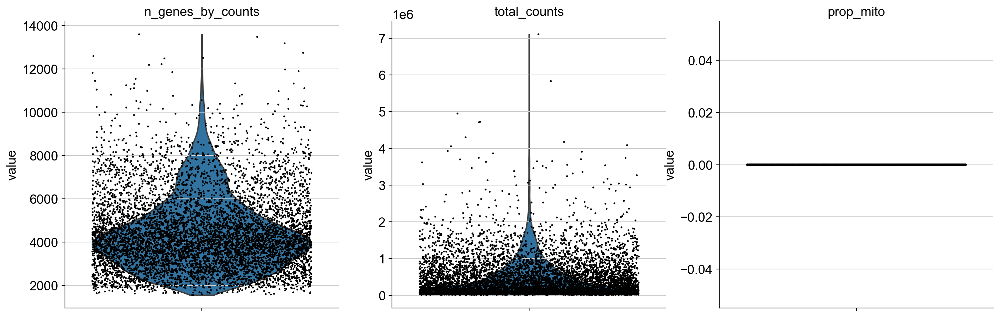

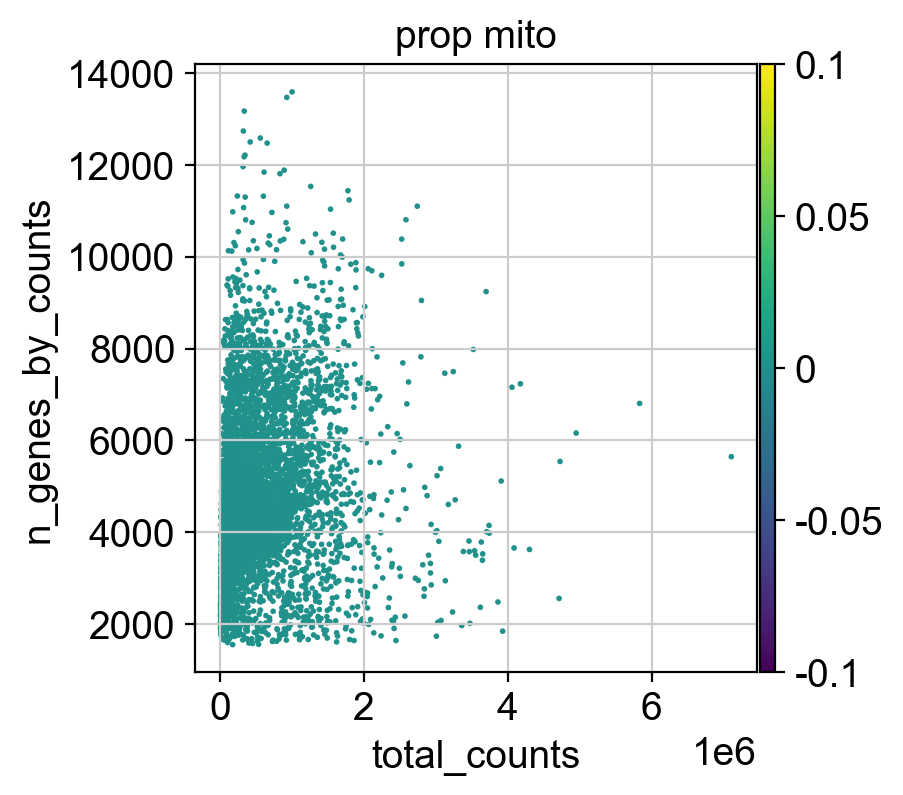

In [5]:
#violin plots of the computed quality measures
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'prop_mito'],
             jitter=0.4, size=2, multi_panel=True)

#Data quality summary plots
plt.rcParams['figure.figsize'] = [4.0, 4.0]
p1 = sc.pl.scatter(adata, 'total_counts', 'n_genes_by_counts', color='prop_mito')

Filter cells according to identified QC thresholds: It looks from the data that cells with few genes and that the mitochondrial reads were already filtered, so this code is for demonstration purposes (except the filtering based on max genes and genes expressed in few cells.) We will choose a cutoff of 8000 max genes for this dataset to start with based on the fact that the number of genes in most cells is well below that.

In [6]:
#Filtering
print('Total number of cells: {:d}'.format(adata.n_obs))
sc.pp.filter_cells(adata, min_genes = 200) 
print('Number of cells after gene filter: {:d}'.format(adata.n_obs))

adata = adata[adata.obs['prop_mito'] < 0.25]
print('Number of cells after MT filter: {:d}'.format(adata.n_obs))

sc.pp.filter_cells(adata, max_genes = 8000)
print('Number of cells after max gene filter: {:d}'.format(adata.n_obs))
print('Total number of cells: {:d}'.format(adata.n_obs))

#Filter genes:
print('Total number of genes: {:d}'.format(adata.n_vars))
# Set based on number of cells in dataset and stringency: 
# filters out 0 count genes/genes with little to no detection in the dataset
sc.pp.filter_genes(adata, min_cells=10)
print('Number of genes after cell filter: {:d}'.format(adata.n_vars))

Total number of cells: 7186
Number of cells after gene filter: 7186
Number of cells after MT filter: 7186


filtered out 289 cells that have more than 8000 genes expressed
Trying to set attribute `.obs` of view, copying.


Number of cells after max gene filter: 6897
Total number of cells: 6897
Total number of genes: 23686


filtered out 2550 genes that are detected in less than 10 cells


Number of genes after cell filter: 21136


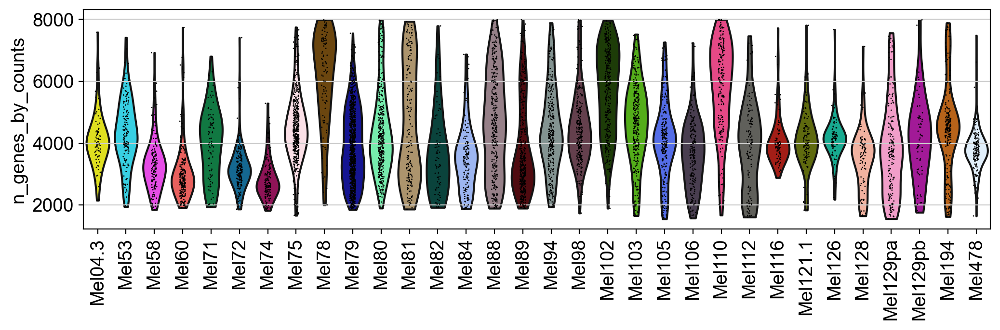

In [7]:
#plot violin plots of the computed quality measures on a per-sample basis
plt.rcParams['figure.figsize'] = [10.0, 3.0]
run_name = 'getting_started_w_scRNAseq_8aug2021' #change this name depending on what dataset you're working with 
t1 = sc.pl.violin(adata, 'n_genes_by_counts', groupby='samples', rotation=90, save=('_%s_ngenes_by_sample.pdf' % (run_name)))

In [8]:
#can use pandas functions like the value_counts function to see the number of cells in each of a particular category (eg sample or compartment)
adata.obs['samples'].value_counts()

Mel79       887
Mel75       502
Mel80       400
Mel89       382
Mel88       339
Mel102      311
Mel103      306
Mel94       300
Mel98       253
Mel105      234
Mel194      232
Mel60       225
Mel110      190
Mel106      190
Mel72       180
Mel81       176
Mel129pa    173
Mel478      154
Mel84       151
Mel74       147
Mel53       141
Mel58       141
Mel112      113
Mel121.1    104
Mel78        97
Mel126       95
Mel71        89
Mel128       88
Mel116       84
Mel04.3      77
Mel82        72
Mel129pb     64
Name: samples, dtype: int64

## Process data

normalizing counts per cell The following highly-expressed genes are not considered during normalization factor computation:
['B2M', 'HBB', 'FOS', 'FTSJ2', 'SERPING1', 'SPP1', 'KLF13', 'CSDE1', 'CCL21', 'IL8', 'IGLL5', 'FDCSP', 'COL1A2', 'FTL', 'VIM', 'KRT6A', 'ELK2AP', 'MALAT1', 'UBC', 'EEF1A1', 'MTRNR2L2', 'COL1A1', 'MTRNR2L8', 'TPSB2', 'KCNQ1OT1', 'ROCK1P1', 'HSPA1A', 'IGJ', 'COL3A1', 'PMEL', 'HBA2', 'FN1', 'CD74', 'APOD', 'LYZ', 'UGDH-AS1', 'SFRP4', 'ACTB', 'SPARC', 'KRT17', 'CCND1', 'CCL4', 'GAPDH', 'PPIA', 'TPSAB1']
    finished (0:00:01)
normalizing counts per cell
    finished (0:00:00)


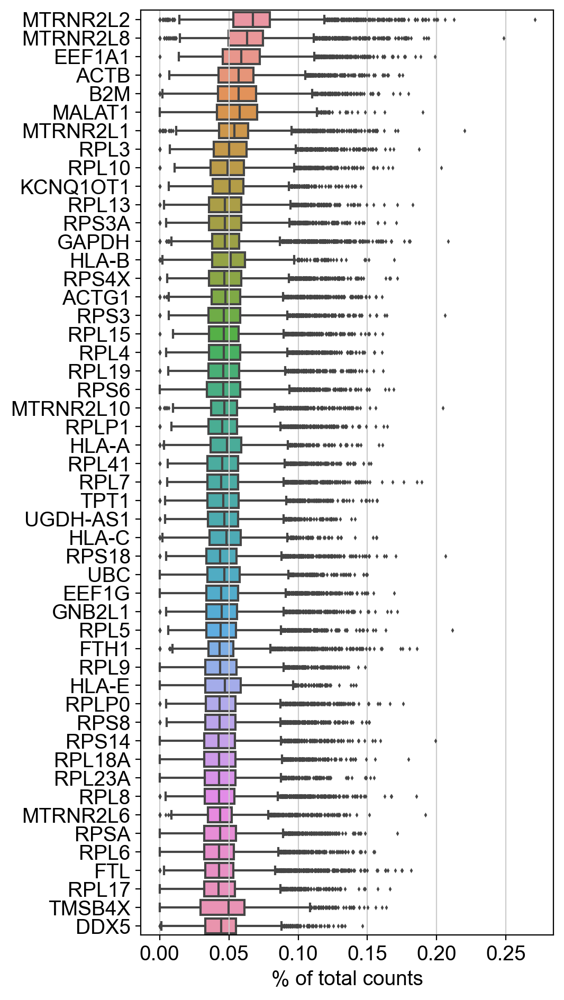

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)



 Number of highly variable genes: 2000


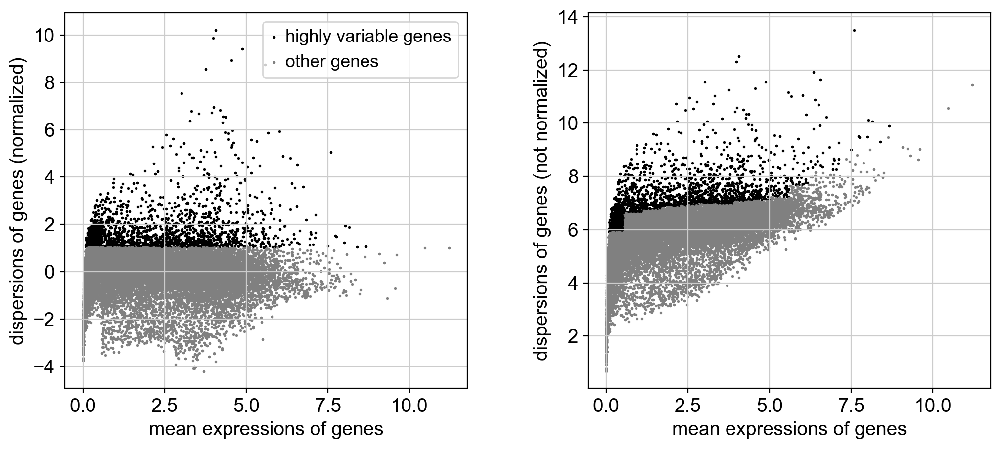

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)


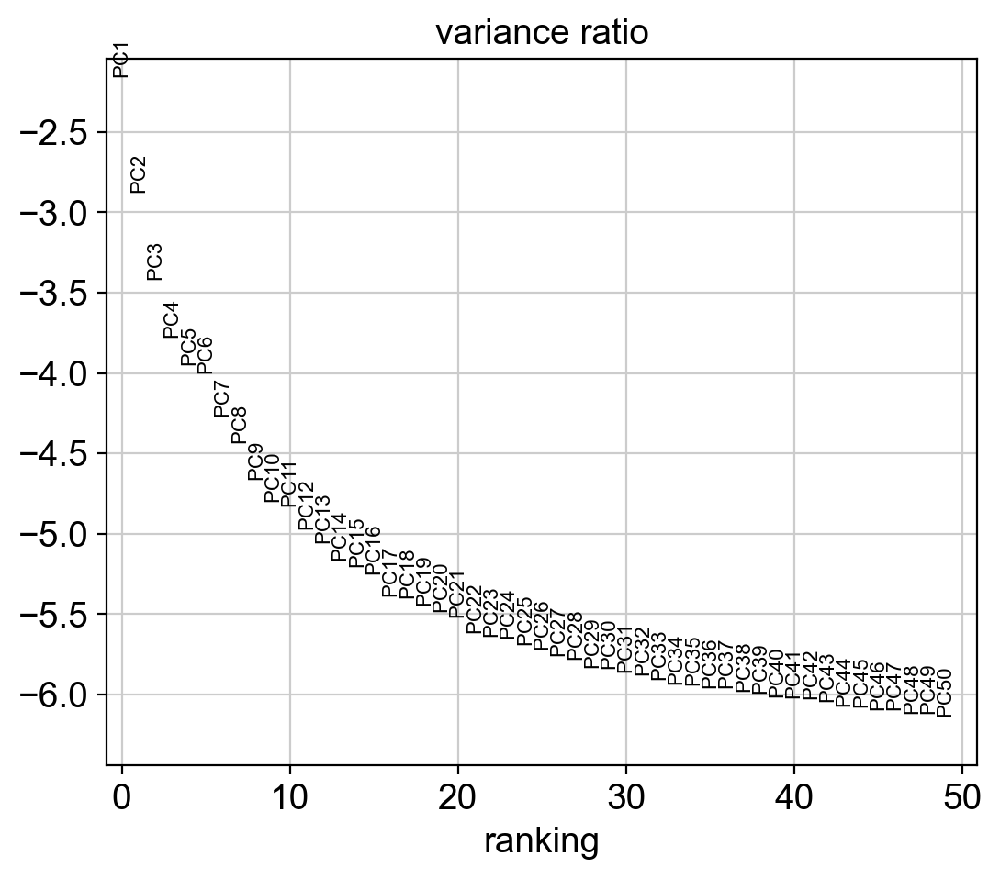

In [9]:
#Put counts data in a counts layer for later access
adata.layers["counts"] = adata.X.copy()

#do CPM normalization, excluding genes that account for at least 5% of the total counts in any cell. 
sc.pp.normalize_total(adata, target_sum=1e6, exclude_highly_expressed=True, max_fraction=0.05)
sc.pp.log1p(adata)

adata.layers["unscaled_norm"] = adata.X.copy()

#Store the log-normalised data in the '.raw' part of the AnnData object as it will be used to visualize gene 
#expression and perform statistical tests such as computing marker genes for clusters.
adata.raw = adata

#optional visualization
#Show those genes that yield the highest fraction of counts in each single cells, across all cells.
plt.rcParams['figure.figsize'] = [2.0, 4.0]
sc.pl.highest_expr_genes(adata, n_top=50, save=('_%s_highest_expressed_genese.pdf' % (run_name)))

sc.pp.highly_variable_genes(adata, flavor='seurat', n_top_genes=2000)
print('\n','Number of highly variable genes: {:d}'.format(np.sum(adata.var['highly_variable'])))
plt.rcParams['figure.figsize'] = [6.0, 5.0]
sc.pl.highly_variable_genes(adata, save=('_%s_hvgs_by_sample.pdf' % (run_name)))

#sc.pp.scale(adata) #can scale gene expression if desired (somewhat equivalent to z-scoring)
#NOTE: cannot rerun sc.pp.highly_variable_genes post-scaling. 
#lets see what this scaled data looks like (if applicable)
#adata.layers["scaled_norm"] = adata.X.copy()
#print(adata.obs_vector('CD8A'))

#NOTE: if desired, can change plot size by updating rcParams figsize
sc.pp.pca(adata, n_comps=50, use_highly_variable=True)
sc.pl.pca_variance_ratio(adata, n_pcs=50, log=True, save=('_%s_pca_var_ratio.pdf' % (run_name))) #try between 30 - 50 pcs 

computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:12)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:08)


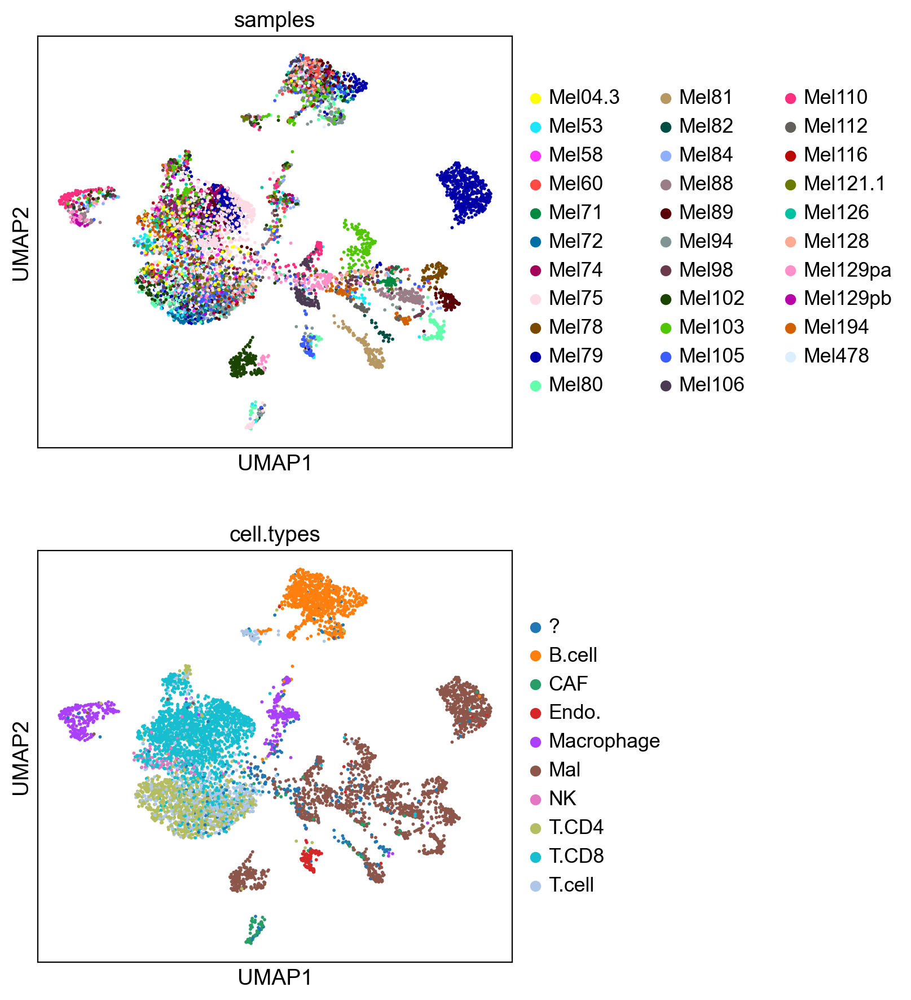

In [10]:
sc.pp.neighbors(adata, n_neighbors=15, n_pcs=20) #based on the variance ratio plot, pick a reasonable number of pcs, can also modify the n_neighbors parameter
sc.tl.umap(adata, min_dist=0.5, n_components=2) #can lower or raise the min distance (eg. 0.2)
plt.rcParams['figure.figsize'] = [5.0, 5.0]
sc.pl.umap(adata, color=['samples', 
                         'cell.types'], ncols=1, color_map=mymap, 
           save=('_%s_15nn_20pc_samples_celltypes.pdf' % (run_name)))

running Leiden clustering
    finished: found 7 clusters and added
    'leiden_r01', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 11 clusters and added
    'leiden_r02', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 15 clusters and added
    'leiden_r05', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 22 clusters and added
    'leiden_r1', the cluster labels (adata.obs, categorical) (0:00:00)


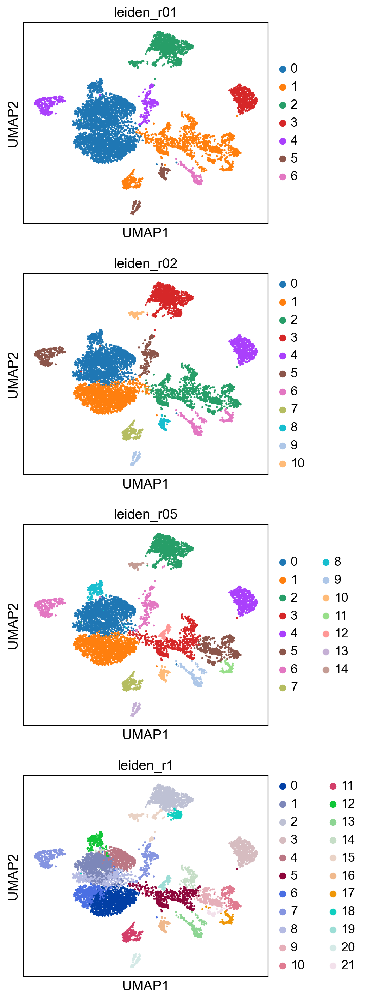

In [11]:
#compute leiden for a few different settings/resolutions:
plt.rcParams['figure.figsize'] = [4.0, 4.0]
sc.tl.leiden(adata, resolution=0.1, key_added='leiden_r01', random_state=0)
sc.tl.leiden(adata, resolution=0.2, key_added='leiden_r02', random_state=0)
sc.tl.leiden(adata, resolution=0.5, key_added='leiden_r05', random_state=0)
sc.tl.leiden(adata, resolution=1, key_added='leiden_r1', random_state=0)

sc.pl.umap(adata, color=['leiden_r01', 'leiden_r02', 'leiden_r05', 'leiden_r1'], ncols=1,
           color_map=mymap,  save=('_%s_leiden_settings_15nn_20pc.pdf' % (run_name)))

In [ ]:
#if you want to write out an h5 to save your progress you can use the write function  
#adata.write(('./data/%s_h5_updated.h5ad' % run_name))

## Rank genes / find DE genes

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:12)


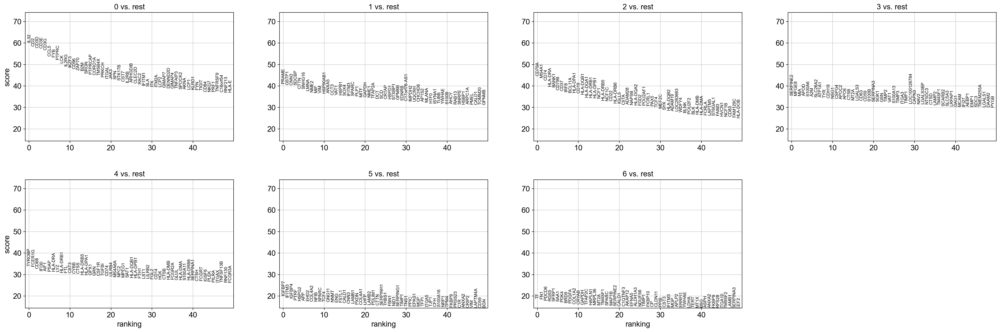

ranking genes
/Users/emilyrobitschek/opt/anaconda3/envs/infercnv_env/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:33)


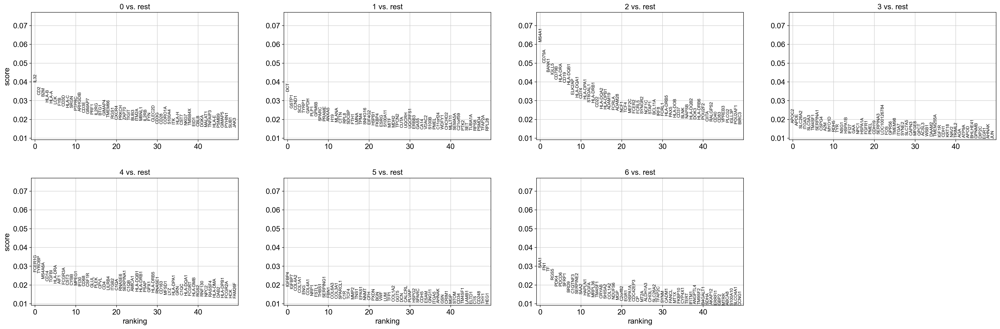

In [13]:
#rg_groups = 'cell.types' #select the groups that you want to use to look at DE genes
rg_groups = 'leiden_r01' #can use existing metadata from GEO/publication or computed variables like leiden clustering 
sc.tl.rank_genes_groups(adata, groupby=rg_groups, n_genes=50, method='wilcoxon') 
plt.rcParams['figure.figsize'] = [8.0, 5.0]
sc.pl.rank_genes_groups(adata, groupby=rg_groups, n_genes=50, save=('_%s_wilcoxon_top50.pdf' % (run_name)))

#can also look at genes called as DE by logistic regression method:
sc.tl.rank_genes_groups(adata, groupby=rg_groups, n_genes=50, method='logreg') #takes longer than wilcoxon
plt.rcParams['figure.figsize'] = [8.0, 5.0]
sc.pl.rank_genes_groups(adata, groupby=rg_groups, n_genes=50, save=('_%s_logreg_top50.pdf' % (run_name)))

## Examine PC contributions

/Users/emilyrobitschek/opt/anaconda3/envs/infercnv_env/lib/python3.8/site-packages/matplotlib/backends/_backend_pdf_ps.py:109: RuntimeWarning: Glyph 8942 missing from current font.
  font.set_text(s, 0.0, flags=ft2font.LOAD_NO_HINTING)
/Users/emilyrobitschek/opt/anaconda3/envs/infercnv_env/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:240: RuntimeWarning: Glyph 8942 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/Users/emilyrobitschek/opt/anaconda3/envs/infercnv_env/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:203: RuntimeWarning: Glyph 8942 missing from current font.
  font.set_text(s, 0, flags=flags)


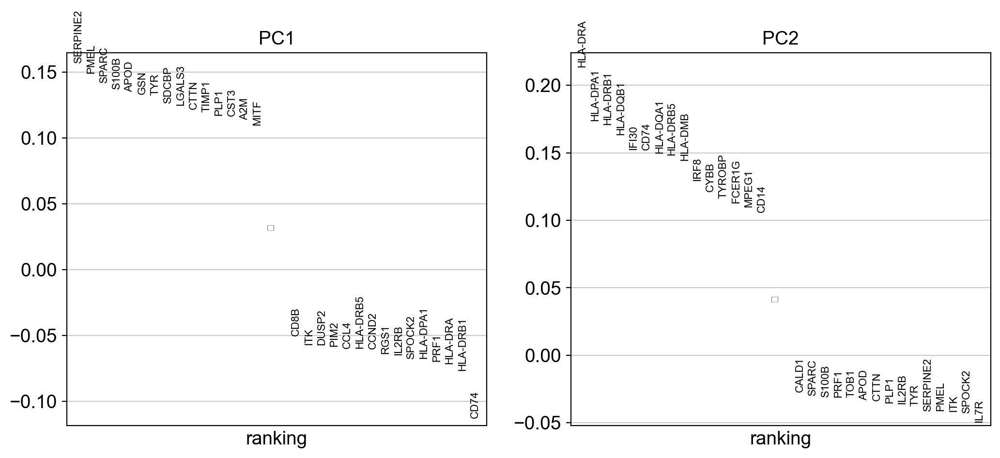

In [14]:
#to look at genes that contribute to each PC you can use the following visualization 
components=  '1,2'  #'1,2,3,4,5,6,7,8,9,10' #for the first 10 you can add component too
plt.rcParams['figure.figsize'] = [6.0, 5.0]
sc.pl.pca_loadings(adata, components=components, 
                   include_lowest=True, show=None, 
                   save=('_%s_%s_w_lower.pdf' % (run_name, components))) 

## Visualize gene expression on UMAP 

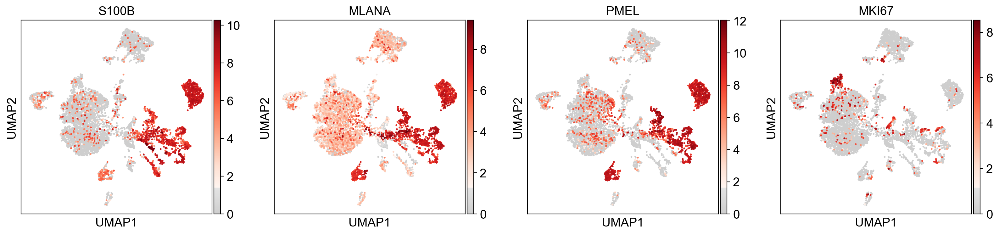

In [15]:
plt.rcParams['figure.figsize'] = [4.0, 4.0] 
#use custom colormaps from the beginning of this file like mymap, mymap2 etc - these are nicer than the default
sc.pl.umap(adata, color=['S100B', 'MLANA', 'PMEL', 'MKI67'], 
           ncols=4, color_map=mymap, 
           save=('_%s_tumor_markers_general.pdf' % (run_name)))

## Map cell types and leiden clusters (one method)

The cell types are labeled in the metadata here from the publication associated with this data, but if we wanted to call cell types, we could cluster with leiden and look at classic markers for melanoma tumor cells, stromal cells, and immune cells. We can see how the markers align with and are expressed in particular clusters from the leiden clustering at a lower resolution to determine cell types cand compartments.

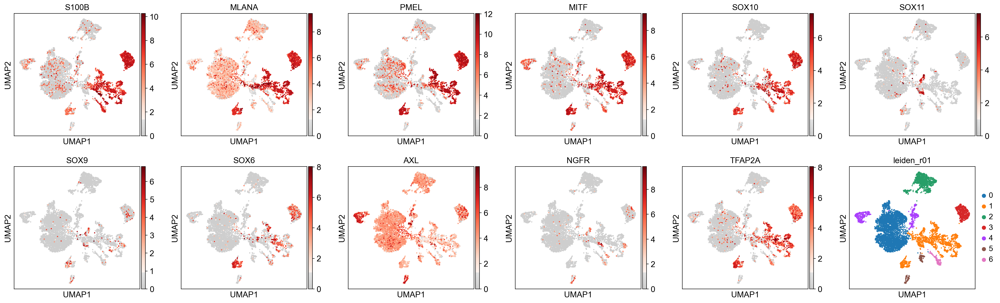

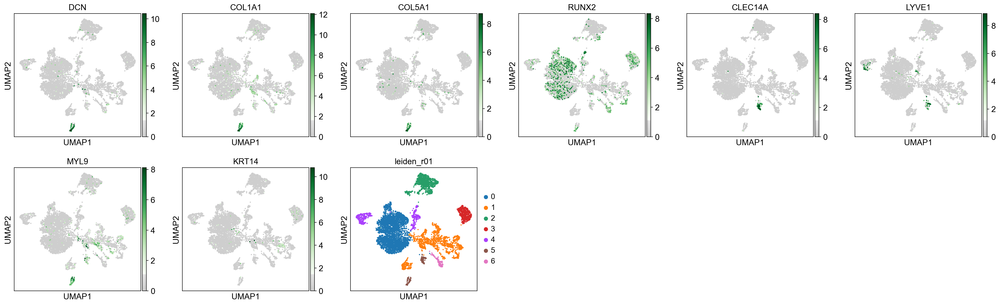

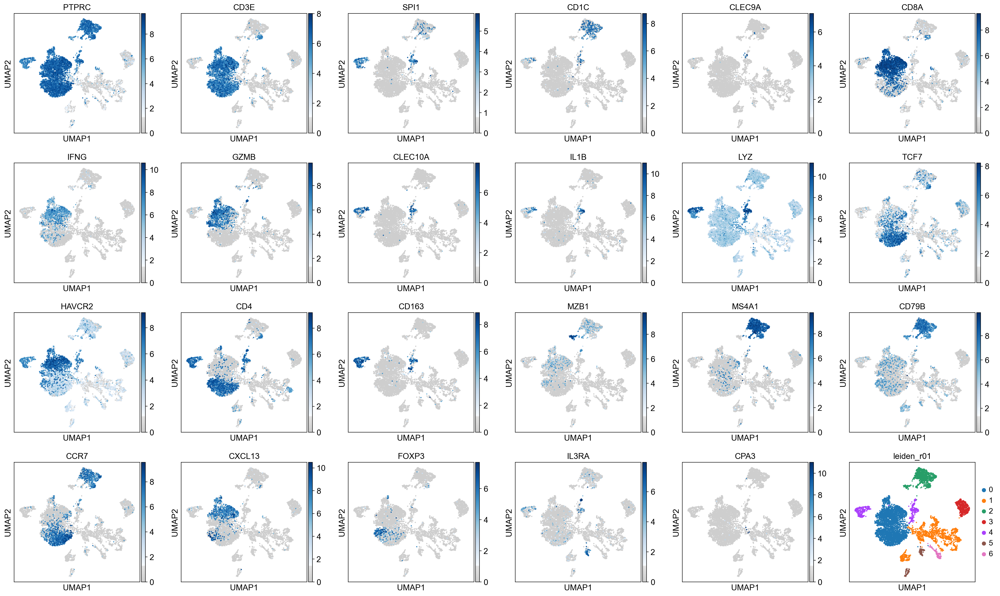

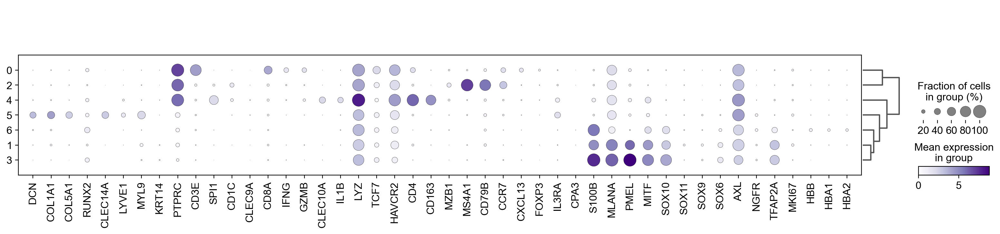

In [20]:
plt.rcParams['figure.figsize'] = [4.0, 4.0] 
#Visualizing marker expression with UMAP plots 

#lets define some initial markers for the tumor, stromal and immune compartments (can always add more)
tumor_markers = ['S100B', 'MLANA', 'PMEL', 'MITF', 'SOX10', 'SOX11', 'SOX9', 
                 'SOX6', 'AXL', 'NGFR', 'TFAP2A']
stromal_markers = ['DCN', 'COL1A1', 'COL5A1', 'RUNX2', 'CLEC14A', 'LYVE1', 'MYL9', 'KRT14']
immune_markers = ['PTPRC', 'CD3E', 'CD8B', 'CD4', 'FOXP3', 'PRF1', 'SPI1', 
                  'C1QA', 'LYZ', 'CD14', 'MS4A1', 'CD79A']
immune_markers = ['PTPRC', 'CD3E', 'SPI1', 'CD1C', 'CLEC9A', 
                        'CD8A', 'IFNG', 'GZMB', 'CLEC10A', 'IL1B', 'LYZ', 
                        'TCF7', 'HAVCR2', 'CD4', 'CD163', 'MZB1', 'MS4A1', 'CD79B', 
                        'CCR7', 'CXCL13', 'FOXP3', 'IL3RA', 'CPA3'] 
#NOTE: 'TRBC1', 'JCHAIN' usually included in immune markers but not found in this dataset

sc.pl.umap(adata, color=(tumor_markers + ['leiden_r01']), 
           ncols=6, color_map=mymap, 
           save=('_%s_tumor_markers_v1.pdf' % (run_name)))

sc.pl.umap(adata, color=(stromal_markers + ['leiden_r01']), 
           ncols=6, color_map=mymap3, 
           save=('_%s_stromal_markers_v1.pdf' % (run_name)))

sc.pl.umap(adata, color=(immune_markers + ['leiden_r01']), 
           ncols=6, color_map=mymap2, 
           save=('_%s_immune_markers_v1.pdf' % (run_name)))

#Visualizing marker expression with dotplot
sc.pl.dotplot(adata, (stromal_markers + immune_markers + tumor_markers + ['MKI67', 'HBB', 'HBA1', 'HBA2']), 
              'leiden_r01', dendrogram=True, cmap='Purples', 
              save=('_%s_celltype_markers_v1.pdf' % (run_name)))

... storing 'compartment' as categorical


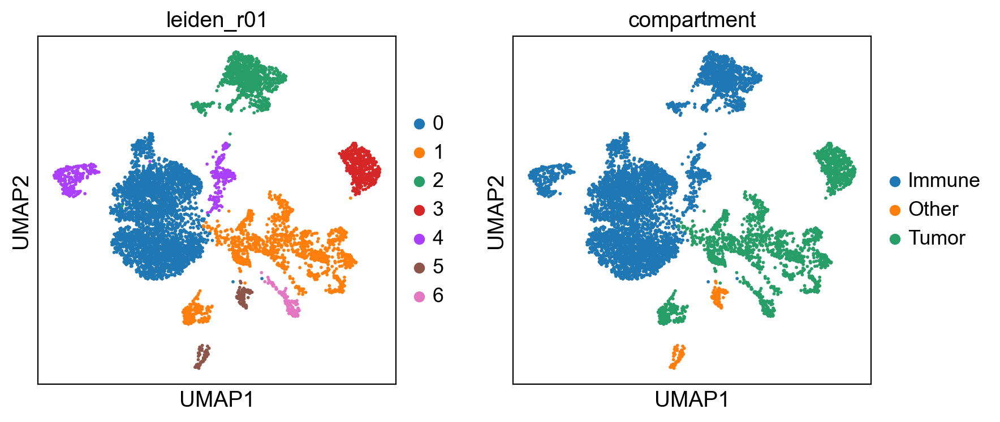

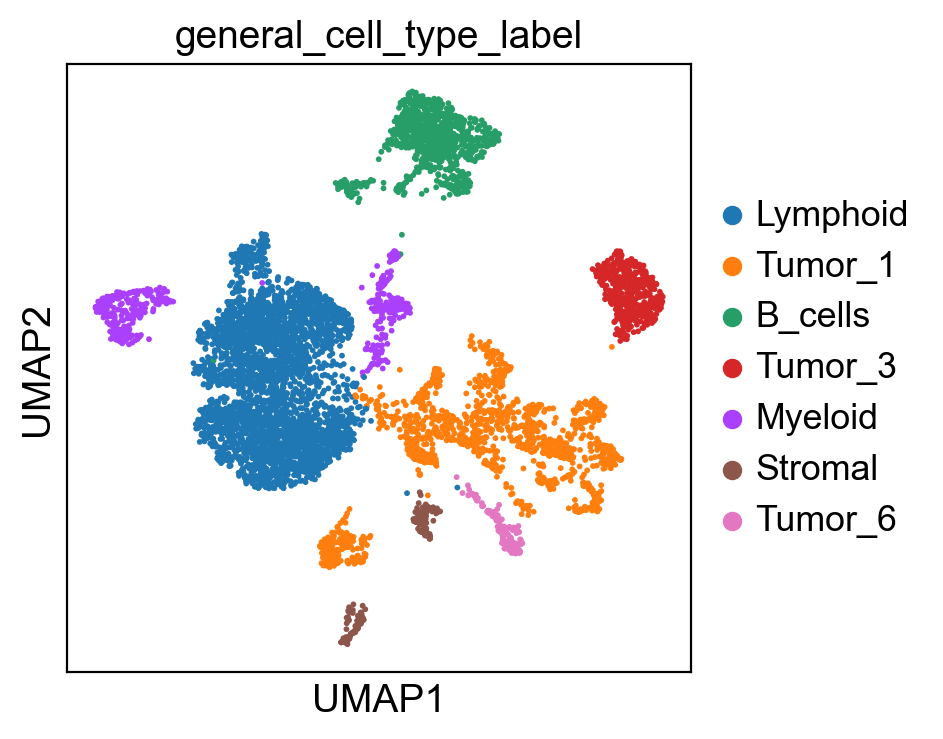

In [21]:
#label for mapping: 
leiden_label = 'leiden_r01'

#use a dictionary and fill in cell types based on markers
general_cell_type_pred = {'0':'Lymphoid',
                               '1':'Tumor_1',
                               '2':'B_cells',
                               '3':'Tumor_3', 
                               '4':'Myeloid',
                               '5':'Stromal',
                               '6':'Tumor_6'
                                }

compartment_pred =  {'0': 'Immune',
                     '1': 'Tumor',
                     '2':'Immune',
                     '3':'Tumor',
                     '4':'Immune',
                     '5':'Other',
                     '6':'Tumor'
                                }

adata.obs['compartment'] = None
adata.obs['general_cell_type_label'] = None

adata.obs['compartment'] = adata.obs[leiden_label].map(compartment_pred)
adata.obs['general_cell_type_label'] = adata.obs[leiden_label].map(general_cell_type_pred)

sc.pl.umap(adata, color=[leiden_label, 'compartment'], color_map=mymap)
sc.pl.umap(adata, color=['general_cell_type_label'], color_map=mymap)

## program scoring example

Sometimes you might want to see if certain gene programs previously identified in the literature score highly in certain cells in your dataset to see if they are detectable and to have a measure to eventually relate to clinical variables. Scanpy has some native functions for this. (See example of AXL and MITF and NGFR programs in melanoma cells as shown below.)

computing score 'mitf_tirosh'
    finished: added
    'mitf_tirosh', score of gene set (adata.obs).
    695 total control genes are used. (0:00:01)
computing score 'axl_tirosh'
    finished: added
    'axl_tirosh', score of gene set (adata.obs).
    848 total control genes are used. (0:00:00)
computing score 'ngfr_restivo'
    finished: added
    'ngfr_restivo', score of gene set (adata.obs).
    745 total control genes are used. (0:00:00)


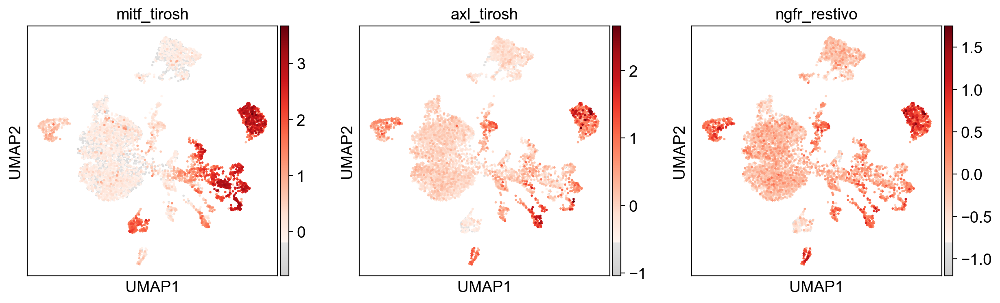

In [22]:
#score cells for MITF/AXL/NGFR programs 
mitf_axl_tirosh = '/Users/emilyrobitschek/scRNAseq/mitf_axl_from_tirosh2016.txt'
mitf_axl_tirosh_table = pd.read_table(mitf_axl_tirosh, delimiter='\t')
mitf_genes_tirosh = list(mitf_axl_tirosh_table['MITF_SIG'].dropna())
axl_genes_tirosh = list(mitf_axl_tirosh_table['AXL_SIG'].dropna())
ngfr_restivo = ['S100A2', 'IGFBP5', 'DKK1', 'VGF', 'OGFOD2', 'COL6A3', 'TIMP3', 'C1QTNF9', 'EGR2', 'KIAA1199', 
                'TGFBI', 'ITGA3', 'IER3', 'EFNA3', 'SPON2', 'CD9', 'NGFR', 'IL10', 'TNNT1', 'LPL', 'ALCAM',
                'A2M', 'RP11-445F12.2', 'ZNF765', 'CYP24A1', 'ARHGEF5', 'AP001372.2', 'HHIP', 'CYP2D7P1',
                'PTPRE', 'PPAPDC1A', 'UBQLN4', 'FAM19A5', 'IGKV1D-8', 'RP11-93K22.8', 'ZFP36', 'GADD45B', 'BIRC7']

sc.tl.score_genes(adata, mitf_genes_tirosh, score_name='mitf_tirosh')
sc.tl.score_genes(adata, axl_genes_tirosh, score_name='axl_tirosh')
sc.tl.score_genes(adata, ngfr_restivo, score_name='ngfr_restivo')
sc.pl.umap(adata, color=['mitf_tirosh', 'axl_tirosh', 'ngfr_restivo'], color_map=mymap)